# Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn import tree

In [2]:
from sklearn.model_selection import cross_val_score

# functions definition

In [3]:
def missing_data(data):
    """Calculate Total Missing Values: Counts and sorts the total number of missing values in each column.
    Calculate Percentage of Missing Values: Computes and sorts the percentage of missing values in each column.
    Combine Results: Merges the total and percentage of missing values into a single DataFrame."""
    total = data.isnull().sum().sort_values(ascending = False)
    percentage = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percentage], axis = 1, keys = ['Total','Percenatage'])

# Load data

In [4]:
df0 = pd.read_csv('survey_results_public.csv')

In [5]:
pd.set_option('display.max_columns', None)
df0.head()

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,TechDoc,YearsCode,YearsCodePro,DevType,OrgSize,PurchaseInfluence,BuyNewTool,BuildvsBuy,TechEndorse,Country,Currency,CompTotal,LanguageHaveWorkedWith,LanguageWantToWorkWith,LanguageAdmired,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,DatabaseAdmired,PlatformHaveWorkedWith,PlatformWantToWorkWith,PlatformAdmired,WebframeHaveWorkedWith,WebframeWantToWorkWith,WebframeAdmired,EmbeddedHaveWorkedWith,EmbeddedWantToWorkWith,EmbeddedAdmired,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,MiscTechAdmired,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,ToolsTechAdmired,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,NEWCollabToolsAdmired,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackAsyncAdmired,OfficeStackSyncHaveWorkedWith,OfficeStackSyncWantToWorkWith,OfficeStackSyncAdmired,AISearchDevHaveWorkedWith,AISearchDevWantToWorkWith,AISearchDevAdmired,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOHow,SOComm,AISelect,AISent,AIBen,AIAcc,AIComplex,AIToolCurrently Using,AIToolInterested in Using,AIToolNot interested in Using,AINextMuch more integrated,AINextNo change,AINextMore integrated,AINextLess integrated,AINextMuch less integrated,AIThreat,AIEthics,AIChallenges,TBranch,ICorPM,WorkExp,Knowledge_1,Knowledge_2,Knowledge_3,Knowledge_4,Knowledge_5,Knowledge_6,Knowledge_7,Knowledge_8,Knowledge_9,Frequency_1,Frequency_2,Frequency_3,TimeSearching,TimeAnswering,Frustration,ProfessionalTech,ProfessionalCloud,ProfessionalQuestion,Industry,JobSatPoints_1,JobSatPoints_4,JobSatPoints_5,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,United States of America,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I have never visited Stack Overflow or the Sta...,NaN,NaN,NaN,NaN,NaN,Yes,Very favorable,Increase productivity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,API document(s) and/or SDK document(s);User gu...,20,17,"Developer, full-stack",NaN,NaN,NaN,NaN,NaN,United Kingdom of Great Britain and Northern I...,NaN,NaN,Bash/Shell (all shells);Go;HTML/CSS;Java;JavaS...,Bash/Shell (all shells);Go;HTML/CSS;Java;JavaS...,Bash/Shell (all shells);Go;HTML/CSS;Java;JavaS...,Dynamodb;MongoDB;PostgreSQL,PostgreSQL,PostgreSQL,Amazon Web Services (AWS);Heroku;Netlify,Amazon Web Services (AWS);Heroku;Netlify,Amazon Web Services (AWS);Heroku;Netlify,Express;Next.js;Node.js;React,Express;Htmx;Node.js;React;Remix,Express;Node.js;React,NaN,NaN,NaN,NaN,NaN,NaN,Docker;Homebrew;Kubernetes;npm;Vite;Webpack,Docker;Homebrew;Kubernetes;npm;Vite;Webpack,Docker;Homebrew;Kubernetes;npm;Vite;Webpack,PyCharm;Visual Studio Code;WebStorm,PyCharm;Visual Studio Code;WebStorm,PyCharm;Visual Studio Code;WebStorm,MacOS;Windows,MacOS,NaN,NaN,NaN,Microsoft Teams;Slack,Slack,Slack,NaN,NaN,NaN,Stack Overflow for Teams (private knowledge sh...,Multiple times per day,Yes,Multiple times per day,Quickly finding code solutions;Finding reliabl...,"Yes, definitely","No, and I don't plan to",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Individual contributor,17.0,Agree,Disagree,Agree,Agree,Agree,Neither agree nor disa

In [6]:
df0.shape

(65437, 114)

# Exploring Datasets

In [7]:
# Display summaries of each dataset
def summarize_data(df0, name):
    """
    Prints information and the first five rows of the dataset.

    Parameters:
    df (DataFrame): The dataset to summarize.
    name (str): The name of the dataset.

    Returns:
    None
    """
    print(f"\n{name} Dataset Info:")
    print(df0.info())
    print(df0.head())

# Example usage
summarize_data(df0, "Reviews")


Reviews Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65437 entries, 0 to 65436
Columns: 114 entries, ResponseId to JobSat
dtypes: float64(13), int64(1), object(100)
memory usage: 56.9+ MB
None
   ResponseId                      MainBranch                 Age  \
0           1  I am a developer by profession  Under 18 years old   
1           2  I am a developer by profession     35-44 years old   
2           3  I am a developer by profession     45-54 years old   
3           4           I am learning to code     18-24 years old   
4           5  I am a developer by profession     18-24 years old   

            Employment RemoteWork   Check  \
0  Employed, full-time     Remote  Apples   
1  Employed, full-time     Remote  Apples   
2  Employed, full-time     Remote  Apples   
3   Student, full-time        NaN  Apples   
4   Student, full-time        NaN  Apples   

                                    CodingActivities  \
0                                            

# Three Business Questions

- 1). What factors most influence whether an employee works remotely, in-person, or in a hybrid arrangement?

By analyzing the Decision Tree model, we can identify which features (e.g., job role, work experience, education level) are the most significant predictors of an employee's work arrangement.

 - 2). How does job satisfaction (JobSat) correlate with the likelihood of an employee working remotely, in-person, or in a hybrid arrangement?

We can investigate the relationship between job satisfaction scores and work arrangements to see if higher or lower job satisfaction is associated with a particular work arrangement.



- 3). What is the distribution of work arrangements (remote, in-person, hybrid) across different age groups and employment types?
 
By examining the model's predictions and the actual data, we can analyze how work arrangements vary among different age groups (e.g., under 18, 35-44 years old) and employment types (e.g., full-time, student).

# DATA Preparation

# Fill numeric columns with median values

# DATA Wrangling

In [8]:
# Select numerical columns and fill missing values with the median
def fill_missing_numerical(df):
    """
    Selects numerical columns in the DataFrame and fills missing values with the median of each column.

    Parameters:
    df (DataFrame): The DataFrame to process.

    Returns:
    DataFrame: The DataFrame with missing values filled.
    """
    num_cols = df.select_dtypes(include=[np.number]).columns
    df[num_cols] = df[num_cols].fillna(df[num_cols].median())
    return df

# Example usage
df0 = fill_missing_numerical(df0)

Using fillna with the mode for categorical columns helps preserve the dataset's integrity, maintain sample size, and improve model performance by handling missing values in a consistent and meaningful way.

In [9]:
missing_data(df0)

,Total,Percenatage
AINextMuch less integrated,64289,98.245641
AINextLess integrated,63082,96.401119
AINextNo change,52939,80.900714
AINextMuch more integrated,51999,79.464217
EmbeddedAdmired,48704,74.428840
...,...,...
CompTotal,0,0.000000
Check,0,0.000000
Employment,0,0.000000
Age,0,0.000000


In [10]:
# Select categorical columns and fill missing values with the mode
def fill_missing_categorical(df):
    """
    Selects categorical columns in the DataFrame and fills missing values with the mode of each column.

    Parameters:
    df (DataFrame): The DataFrame to process.

    Returns:
    DataFrame: The DataFrame with missing values filled.
    """
    cat_cols = df.select_dtypes(include=[object]).columns
    df[cat_cols] = df[cat_cols].fillna(df[cat_cols].mode().iloc[0])
    return df

# Example usage
df0 = fill_missing_categorical(df0)

# EDA

In [11]:
df0['RemoteWork'].value_counts()

Hybrid (some remote, some in-person)    33646
Remote                                  20831
In-person                               10960
Name: RemoteWork, dtype: int64

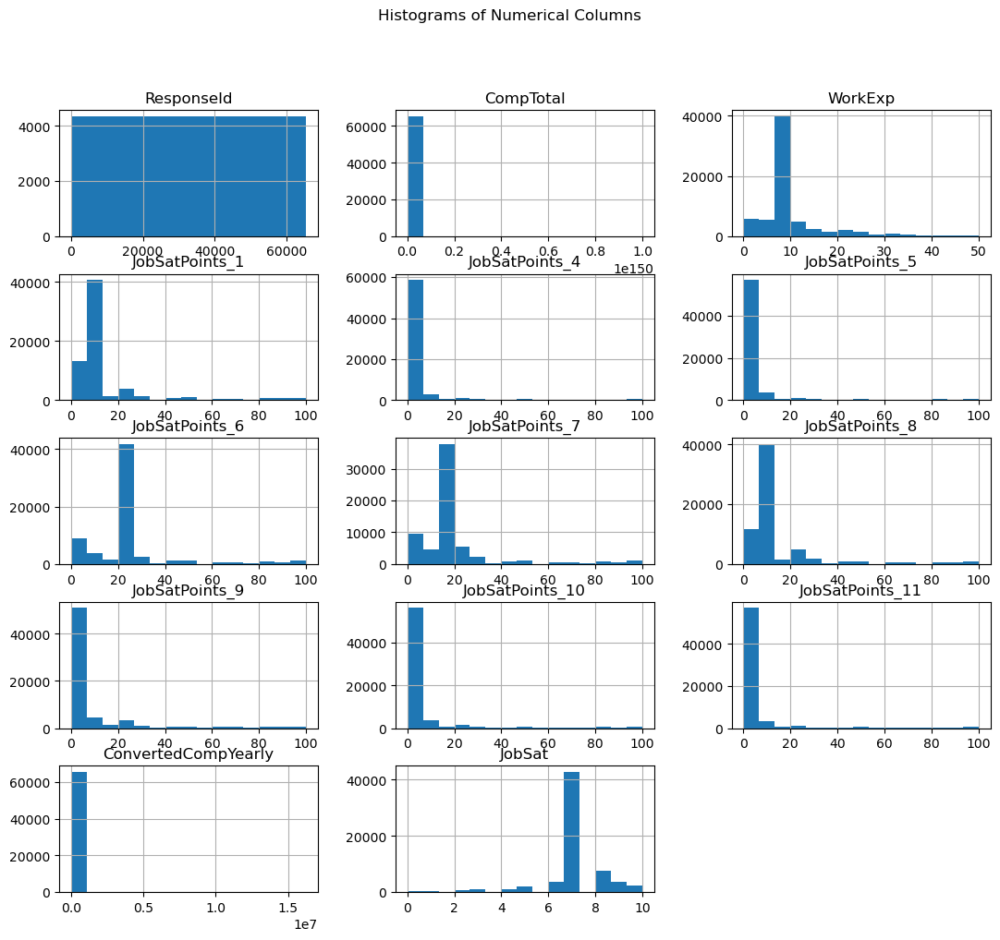

In [12]:
# Plot histograms for all numerical columns
def plot_numerical_histograms(df):
    """
    Plots histograms for all numerical columns in the DataFrame.

    Parameters:
    df (DataFrame): The DataFrame containing the data to plot.

    Returns:
    None
    """
    df.hist(bins=15, figsize=(13, 11), layout=(5, 3))
    plt.suptitle('Histograms of Numerical Columns')
    plt.show()

# Example usage
plot_numerical_histograms(df0)

# Distribution of remote work

In [ ]:
# Calculate the percentage of each category in the 'RemoteWork' column and plot a pie chart
def plot_remote_work_distribution(df):
    """
    Calculates the percentage of each category in the 'RemoteWork' column and plots a pie chart.

    Parameters:
    df (DataFrame): The DataFrame containing the 'RemoteWork' column.

    Returns:
    None
    """
    remotework_counts = df['RemoteWork'].value_counts()
    remotework_percentages = remotework_counts / remotework_counts.sum() * 100

    plt.figure(figsize=(8, 6))
    plt.pie(remotework_percentages, labels=remotework_percentages.index, autopct='%1.1f%%', colors=['skyblue', 'lightgreen', 'red'])
    plt.title('Remote Work Distribution')
    plt.show()

# Example usage
plot_remote_work_distribution(df)

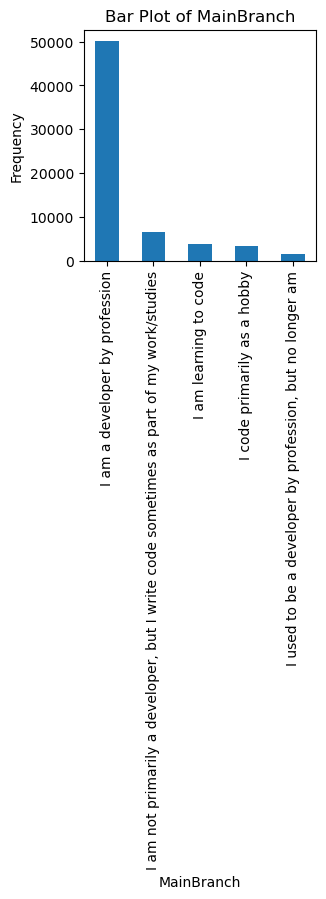

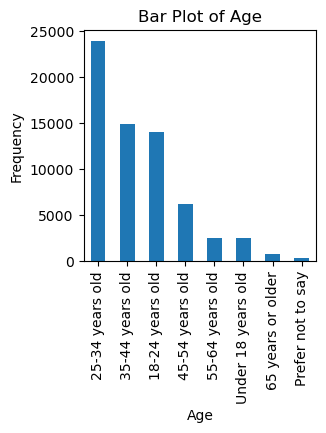

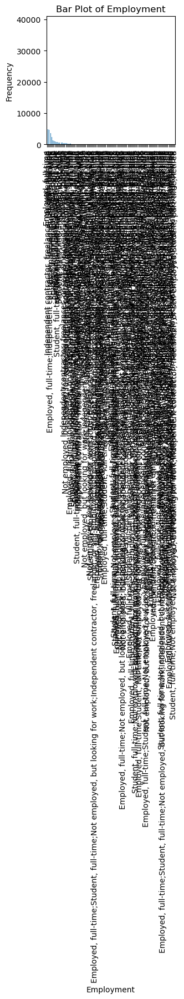

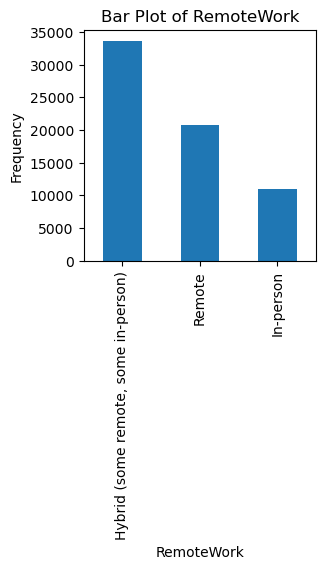

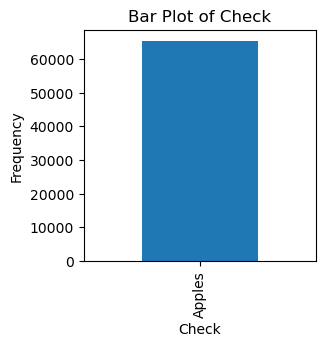

...

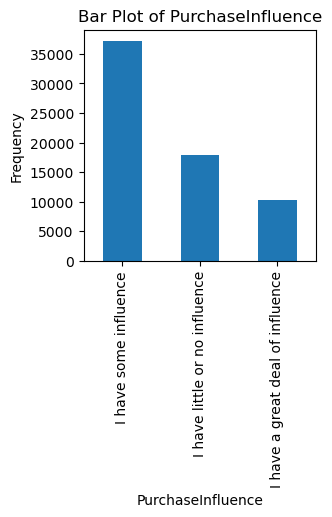

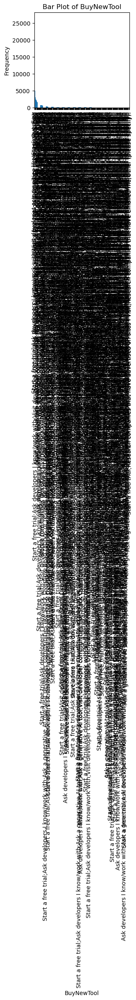

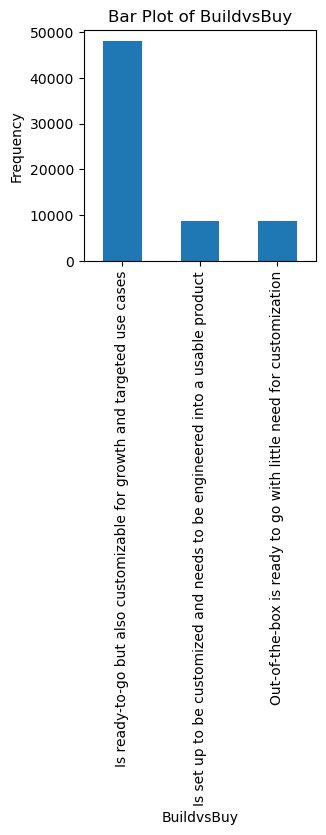

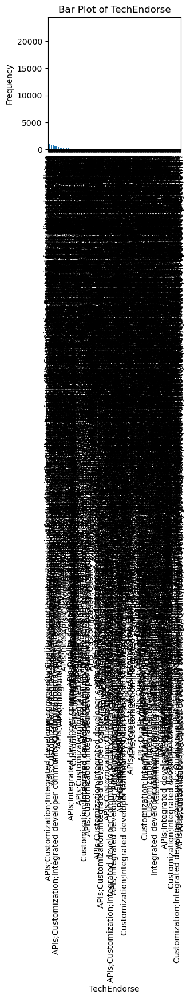

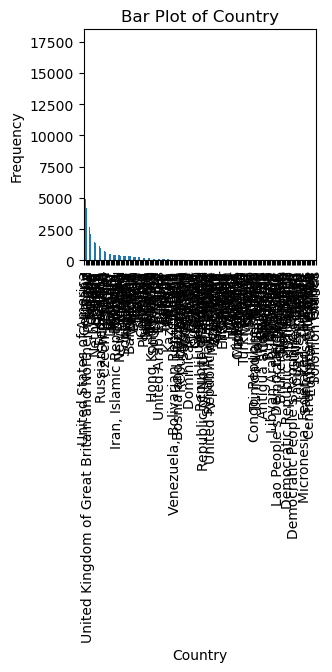

C:\Users\maabn001\AppData\Local\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


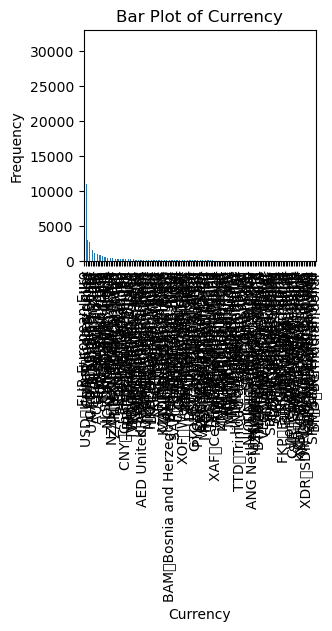

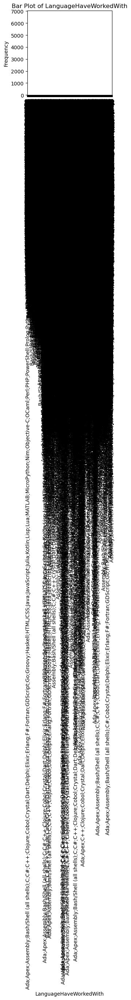

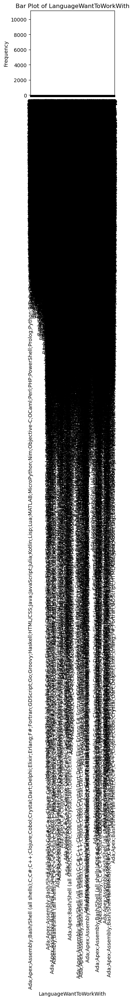

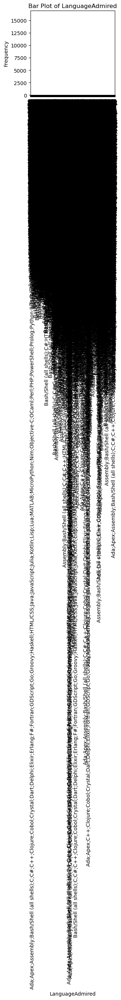

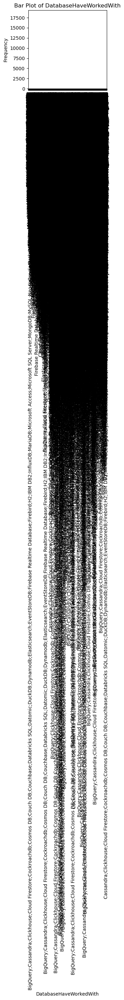

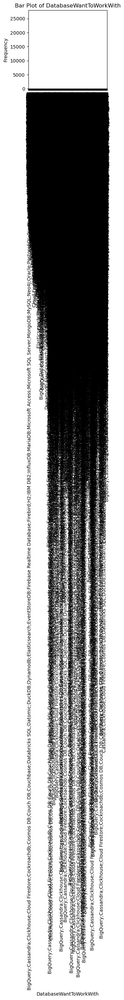

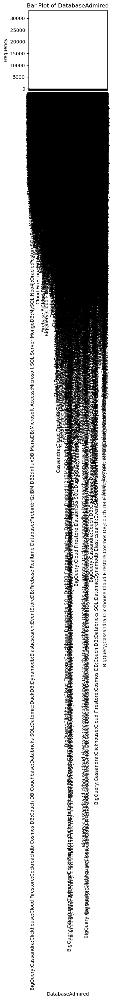

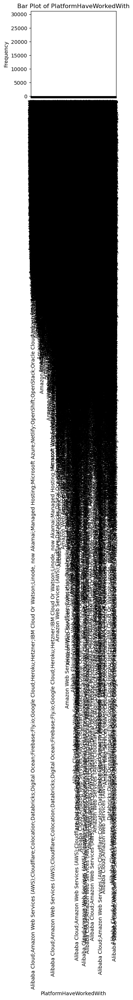

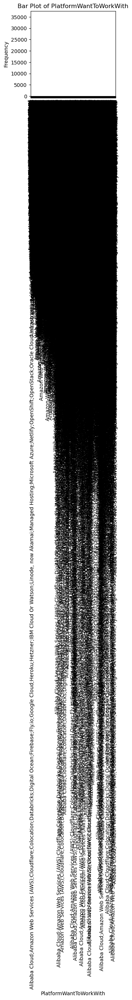

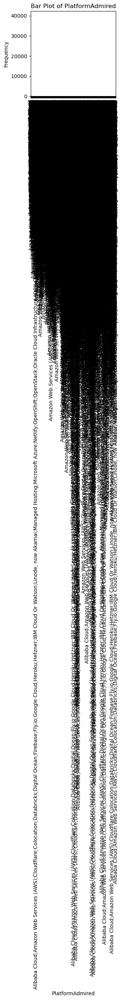

In [ ]:
# Plot bar plots for all categorical columns
def plot_categorical_bars(df):
    """
    Plots bar plots for all categorical columns in the DataFrame.

    Parameters:
    df (DataFrame): The DataFrame containing the data to plot.

    Returns:
    None
    """
    cat_cols = df.select_dtypes(include=['object']).columns

    for col in cat_cols:
        plt.figure(figsize=(3, 3))
        df[col].value_counts().plot(kind='bar')
        plt.title(f'Bar Plot of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()

# Example usage
plot_categorical_bars(df0)

In [ ]:
# Calculate the counts of each category in the 'Employment' column and plot a bar chart
def plot_top_employment_status(df):
    """
    Calculates the counts of each category in the 'Employment' column and plots a bar chart for the top 10 categories.

    Parameters:
    df (DataFrame): The DataFrame containing the 'Employment' column.

    Returns:
    None
    """
    employment_counts = df['Employment'].value_counts()

    # Select the top 10 categories (if there are more than 10 categories)
    top_10_employment = employment_counts.head(10)

    # Plot the bar chart
    plt.figure(figsize=(10, 6))
    plt.bar(top_10_employment.index, top_10_employment.values, color='skyblue')
    plt.xlabel('Employment Status')
    plt.ylabel('Count')
    plt.title('Top 10 Employment Status')
    plt.xticks(rotation=45)
    plt.show()

# Example usage
plot_top_employment_status(df)

# Data Modeling

In [14]:
df = df0[['ResponseId','Age','Employment','JobSat','MainBranch','WorkExp',
          'JobSatPoints_1','JobSatPoints_4','JobSatPoints_5','JobSatPoints_7',
          'JobSatPoints_8','JobSatPoints_11','JobSatPoints_6','JobSatPoints_10',
          'JobSatPoints_9','AISelect','EdLevel','LearnCode','SOAccount','SOVisitFreq',
          'DevType','RemoteWork','YearsCodePro','OrgSize','Industry','ProfessionalCloud'
         ]]

In [15]:
df.dtypes

ResponseId             int64
Age                   object
Employment            object
JobSat               float64
MainBranch            object
WorkExp              float64
JobSatPoints_1       float64
JobSatPoints_4       float64
JobSatPoints_5       float64
JobSatPoints_7       float64
JobSatPoints_8       float64
JobSatPoints_11      float64
JobSatPoints_6       float64
JobSatPoints_10      float64
JobSatPoints_9       float64
AISelect              object
EdLevel               object
LearnCode             object
SOAccount             object
SOVisitFreq           object
DevType               object
RemoteWork            object
YearsCodePro          object
OrgSize               object
Industry              object
ProfessionalCloud     object
dtype: object

# Preprocess data: Encode categorical variables

In [19]:
df_encoded = pd.get_dummies(df.drop(columns=['ResponseId']), drop_first=True)

In [20]:
df_encoded.head()

,JobSat,WorkExp,JobSatPoints_1,JobSatPoints_4,JobSatPoints_5,JobSatPoints_7,JobSatPoints_8,JobSatPoints_11,JobSatPoints_6,JobSatPoints_10,JobSatPoints_9,Age_25-34 years old,Age_35-44 years old,Age_45-54 years old,Age_55-64 years old,Age_65 years or older,Age_Prefer not to say,Age_Under 18 years old,"Employment_Employed, full-time;Employed, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Employed, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Employed, part-time;Retired","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Employed, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Student, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Retired","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Student, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Employed, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Retired","Employment_Employed, full-time;Not employed, and not looking for work","Employment_Employed, full-time;Not employed, but looking for work","Employment_Employed, full-time;Not employed, but looking for work;Employed, part-time","Employment_Employed, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed","Employment_Employed, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Employed, part-time","Employment_Employed, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Employed, part-time","Employment_Employed, full-time;Not employed, but looking for work;Not employed, and not looking for work;Employed, part-time","Employment_Employed, full-time;Not employed, but looking for work;Student, part-time","Employment_Employed, full-time;Retired","Employment_Employed, full-time;Student, full-time","Employment_Employed, full-time;Student, full-time;Employed, part-time","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed;Employed, part-time","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Employed, part-time","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Employed, part-time;Retired","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Retired","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Employed, part-time","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Student, part-time;Employed, part-time","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;

# Split data into features and target

In [21]:
X = df_encoded.drop(columns=['RemoteWork_Remote','RemoteWork_In-person'])
y = df['RemoteWork']

In [22]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)


In [23]:
# Train Decision Tree model
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

In [24]:
# Predict on test set
y_pred = model.predict(X_test)

In [25]:
# convert predictions to Dataframe
df_pred = pd.DataFrame({
    'Actual': y_test.values,
    'Predicted': y_pred
}, index=X_test.index)

In [26]:
# merge with the original dataset
df_analysis = X_test.copy()
df_analysis['Actual'] = y_test.values
df_analysis['Predicted'] = y_pred

In [27]:
# save to csv for further analysis
df_analysis.to_csv('model_predictions_analysis.csv', index=False)

In [28]:
df_analysis.head()

,JobSat,WorkExp,JobSatPoints_1,JobSatPoints_4,JobSatPoints_5,JobSatPoints_7,JobSatPoints_8,JobSatPoints_11,JobSatPoints_6,JobSatPoints_10,JobSatPoints_9,Age_25-34 years old,Age_35-44 years old,Age_45-54 years old,Age_55-64 years old,Age_65 years or older,Age_Prefer not to say,Age_Under 18 years old,"Employment_Employed, full-time;Employed, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Employed, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Employed, part-time;Retired","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Employed, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Student, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Retired","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Student, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Employed, part-time","Employment_Employed, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Retired","Employment_Employed, full-time;Not employed, and not looking for work","Employment_Employed, full-time;Not employed, but looking for work","Employment_Employed, full-time;Not employed, but looking for work;Employed, part-time","Employment_Employed, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed","Employment_Employed, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Employed, part-time","Employment_Employed, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Employed, part-time","Employment_Employed, full-time;Not employed, but looking for work;Not employed, and not looking for work;Employed, part-time","Employment_Employed, full-time;Not employed, but looking for work;Student, part-time","Employment_Employed, full-time;Retired","Employment_Employed, full-time;Student, full-time","Employment_Employed, full-time;Student, full-time;Employed, part-time","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed;Employed, part-time","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Employed, part-time","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Employed, part-time;Retired","Employment_Employed, full-time;Student, full-time;Independent contractor, freelancer, or self-employed;Student, part-time;Retired","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Employed, part-time","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Student, part-time;Employed, part-time","Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;

In [29]:
# Evaluate the pruned model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.5205786471067645
Classification Report:
                                      precision    recall  f1-score   support

Hybrid (some remote, some in-person)       0.62      0.64      0.63     10118
                           In-person       0.30      0.28      0.29      3266
                              Remote       0.47      0.45      0.46      6248

                            accuracy                           0.52     19632
                           macro avg       0.46      0.46      0.46     19632
                        weighted avg       0.52      0.52      0.52     19632

Confusion Matrix:
[[6474 1266 2378]
 [1507  918  841]
 [2543  877 2828]]


In [30]:
# Perform 5-fold cross-validation
scores = cross_val_score(model, X, y, cv=5)

# Print the average accuracy
print(f"Cross-Validation Accuracy: {np.mean(scores)}")

Cross-Validation Accuracy: 0.52358776360871


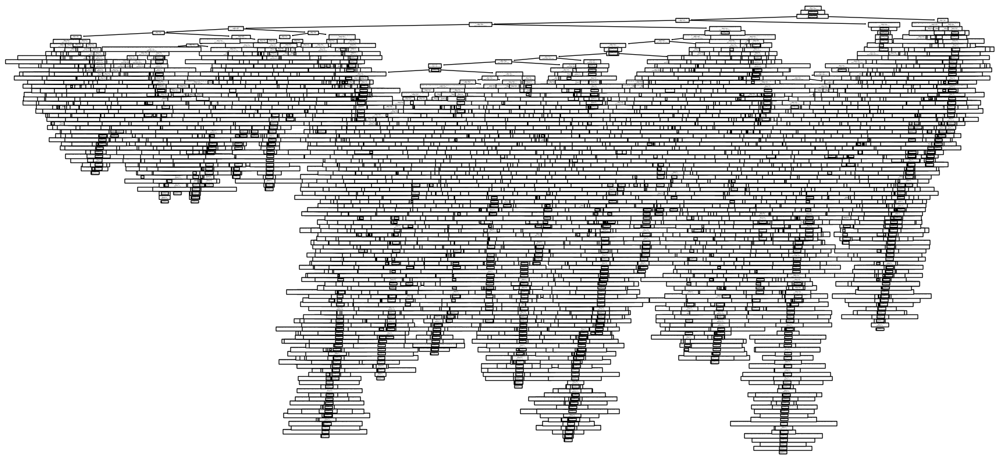

In [21]:
# Visualize Decision Tree
plt.figure(figsize=(20,10))
tree.plot_tree(model.fit(X_train,y_train), feature_names=X.columns)
plt.show()

Interpretation:
- Nodes: Represent decisions based on features.
- Branches: Show outcomes of decisions.
- Leaves: Indicate final classifications.
- Feature Names: Displayed at each node.
- Thresholds: Shown for splitting data.

- merge the original dataset to predictions

In [32]:

# Ensure df1 is the original DataFrame before encoding
df_analysis = df.loc[X_test.index].copy()  # Select rows corresponding to X_test

# Add the actual and predicted work arrangements
df_analysis['Actual_WorkArrangement'] = y_test.values
df_analysis['Predicted_WorkArrangement'] = y_pred


In [33]:
# Display the first few rows
df_analysis.columns

Index(['ResponseId', 'Age', 'Employment', 'JobSat', 'MainBranch', 'WorkExp',
       'JobSatPoints_1', 'JobSatPoints_4', 'JobSatPoints_5', 'JobSatPoints_7',
       'JobSatPoints_8', 'JobSatPoints_11', 'JobSatPoints_6',
       'JobSatPoints_10', 'JobSatPoints_9', 'AISelect', 'EdLevel', 'LearnCode',
       'SOAccount', 'SOVisitFreq', 'DevType', 'RemoteWork', 'YearsCodePro',
       'OrgSize', 'Industry', 'ProfessionalCloud', 'Actual_WorkArrangement',
       'Predicted_WorkArrangement'],
      dtype='object')

# Evaluate the Results

# Question 1: Feature Importance

What factors most influence whether an employee works remotely, in-person, or in a hybrid arrangement?
By analyzing the Decision Tree model, we can identify which features (e.g., job role, work experience, education level) are the most significant predictors of an employee's work arrangement.

                                              Feature  Importance
97                      Employment_Student, full-time    0.048757
1                                             WorkExp    0.033119
78      Employment_Not employed, but looking for work    0.027542
0                                              JobSat    0.023432
5                                      JobSatPoints_7    0.022542
2                                      JobSatPoints_1    0.020920
6                                      JobSatPoints_8    0.020776
61  Employment_Independent contractor, freelancer,...    0.020027
10                                     JobSatPoints_9    0.018903
8                                      JobSatPoints_6    0.018853


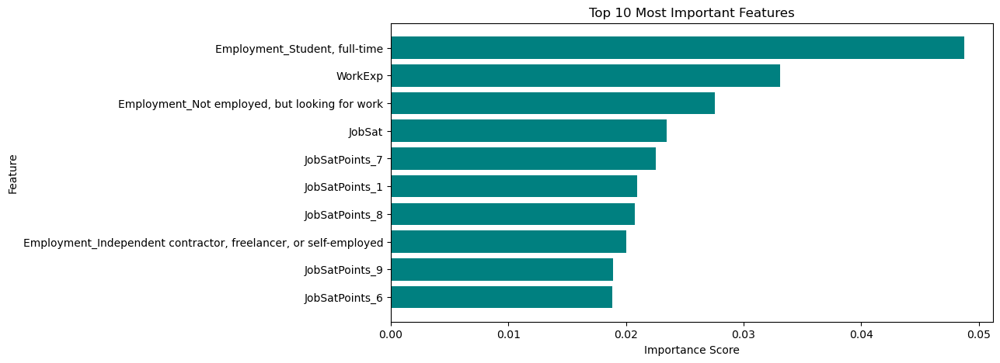

In [34]:
# Get feature importance scores
feature_importance = model.feature_importances_

# Create DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importance
})

# Sort by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display top features
print(feature_importance_df.head(10))  # Top 10 most important features

# Plot
plt.figure(figsize=(10, 5))
plt.barh(feature_importance_df['Feature'][:10], feature_importance_df['Importance'][:10], color='teal')
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.title("Top 10 Most Important Features")
plt.gca().invert_yaxis()
plt.show()

The most significant factors influencing work arrangements are:

- Employment type – Students, job seekers, and freelancers experience different levels of flexibility.
- Work experience – More experienced employees may have more negotiating power over their work setup.
- Job satisfaction – Employees in fulfilling jobs are more likely to have flexible arrangements.

# Question 2: Job Satisfaction vs Work Arrangement

How does job satisfaction (JobSat) correlate with the likelihood of an employee working remotely, in-person, or in a hybrid arrangement?
We can investigate the relationship between job satisfaction scores and work arrangements to see if higher or lower job satisfaction is associated with a particular work arrangement.

In [35]:
# Convert 'Actual_WorkArrangement' to numerical values for correlation calculation
# For example: Remote = 0, In-person = 1, Hybrid = 2
work_arrangement_mapping = {'Remote': 0, 'In-person': 1, 'Hybrid': 2}
df_analysis['WorkArrangementNumeric'] = df_analysis['Actual_WorkArrangement'].map(work_arrangement_mapping)

# Calculate the correlation between JobSat and WorkArrangementNumeric
correlation = df_analysis[['JobSat', 'WorkArrangementNumeric']].corr()

print("Correlation between JobSat and Actual_WorkArrangement:")
print(correlation)

Correlation between JobSat and Actual_WorkArrangement:
                          JobSat  WorkArrangementNumeric
JobSat                  1.000000               -0.055165
WorkArrangementNumeric -0.055165                1.000000


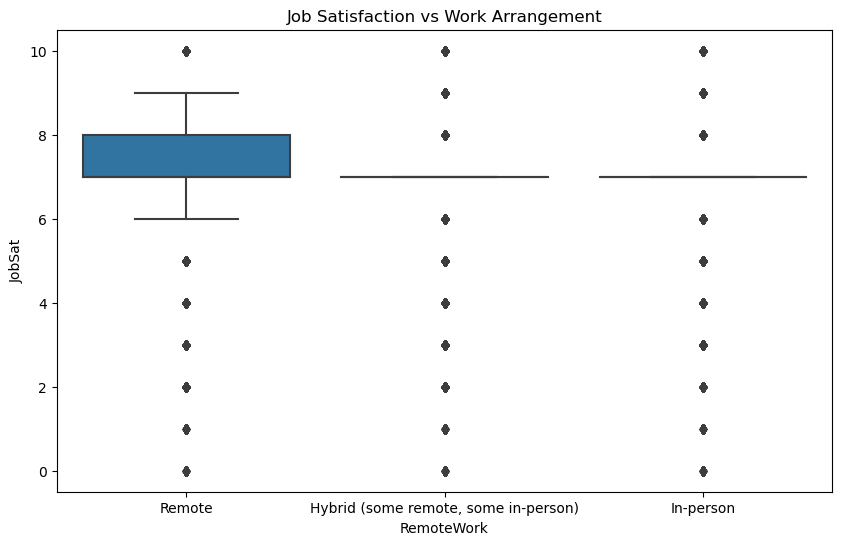

In [36]:

plt.figure(figsize=(10,6))
sns.boxplot(x='RemoteWork', y='JobSat', data=df)
plt.title('Job Satisfaction vs Work Arrangement')
plt.show()

- The correlation coefficient between JobSat and WorkArrangementNumeric is -0.065555.
- This value is very close to 0, indicating a very weak negative correlation.
- A negative correlation means that as one variable increases, the other tends to decrease slightly. However, since the value is close to 0, the relationship is not strong.
- In summary, the correlation results suggest that there is a very weak negative relationship between job satisfaction and the type of work arrangement (remote, in-person, or hybrid). This means that changes in work arrangement have little to no impact on job satisfaction in this dataset.

# Question 3: Work Arrangement Distribution by Age and Employment

What is the distribution of work arrangements (remote, in-person, hybrid) across different age groups and employment types?
By examining the model's predictions and the actual data, we can analyze how work arrangements vary among different age groups (e.g., under 18, 35-44 years old) and employment types (e.g., full-time, student).

In [37]:
df_analysis.columns

Index(['ResponseId', 'Age', 'Employment', 'JobSat', 'MainBranch', 'WorkExp',
       'JobSatPoints_1', 'JobSatPoints_4', 'JobSatPoints_5', 'JobSatPoints_7',
       'JobSatPoints_8', 'JobSatPoints_11', 'JobSatPoints_6',
       'JobSatPoints_10', 'JobSatPoints_9', 'AISelect', 'EdLevel', 'LearnCode',
       'SOAccount', 'SOVisitFreq', 'DevType', 'RemoteWork', 'YearsCodePro',
       'OrgSize', 'Industry', 'ProfessionalCloud', 'Actual_WorkArrangement',
       'Predicted_WorkArrangement', 'WorkArrangementNumeric'],
      dtype='object')

Actual_WorkArrangement                                                 Hybrid (some remote, some in-person)  \
Age                Employment                                                                                 
18-24 years old    Employed, full-time                                                                  540   
                   Employed, full-time;Employed, part-time                                                6   
                   Employed, full-time;Independent contractor, fre...                                    45   
                   Employed, full-time;Independent contractor, fre...                                     3   
                   Employed, full-time;Independent contractor, fre...                                     6   
...                                                                                                     ...   
Under 18 years old Student, full-time;Not employed, but looking fo...                                     3   
 

C:\Users\maabn001\AppData\Local\Temp\ipykernel_19764\1713616066.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=work_arrangement_distribution, x='Age', y='Count', hue='Actual_WorkArrangement', ci=None)


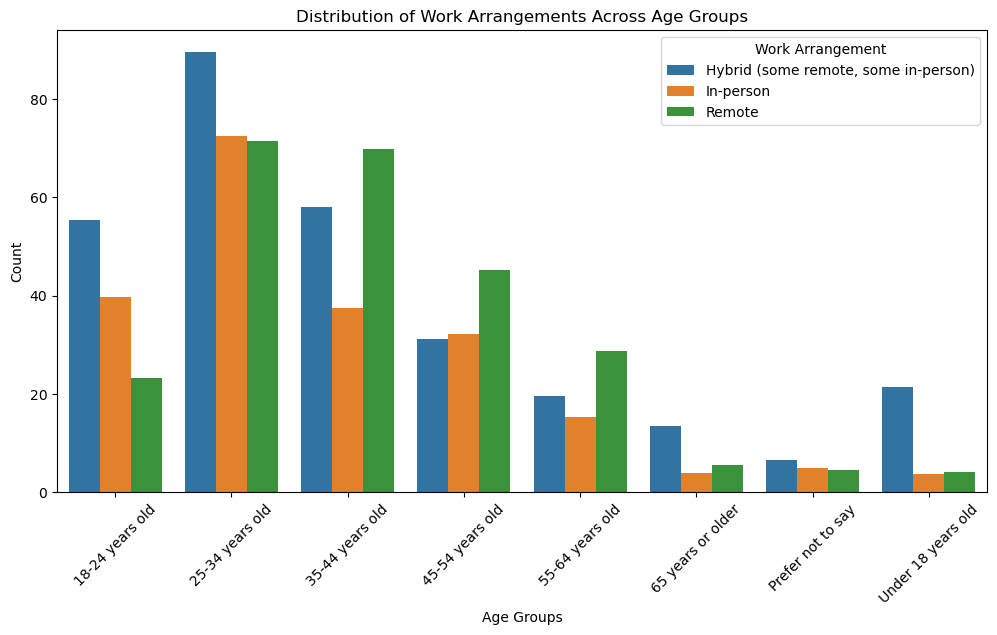

In [38]:
# Create a grouped DataFrame
work_arrangement_distribution = df_analysis.groupby(['Age', 'Employment', 'Actual_WorkArrangement']).size().reset_index(name='Count')

# Pivot the table for better readability
pivot_table = work_arrangement_distribution.pivot_table(index=['Age', 'Employment'], columns='Actual_WorkArrangement', values='Count', fill_value=0)

# Display the pivot table
print(pivot_table)

# Plotting the distribution using a grouped bar chart
plt.figure(figsize=(12, 6))
sns.barplot(data=work_arrangement_distribution, x='Age', y='Count', hue='Actual_WorkArrangement', ci=None)
plt.xlabel('Age Groups')
plt.ylabel('Count')
plt.title('Distribution of Work Arrangements Across Age Groups')
plt.legend(title='Work Arrangement')
plt.xticks(rotation=45)
plt.show()